In [3]:
## Now let's start this task by importing the Python libraries and dataset we need
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

data = pd.read_csv(r"C:\Users\bhbt\Downloads\DailyDelhiClimateTrain.csv")
print (data.head())

         date   meantemp   humidity  wind_speed  meanpressure
0  2013-01-01  10.000000  84.500000    0.000000   1015.666667
1  2013-01-02   7.400000  92.000000    2.980000   1017.800000
2  2013-01-03   7.166667  87.000000    4.633333   1018.666667
3  2013-01-04   8.666667  71.333333    1.233333   1017.166667
4  2013-01-05   6.000000  86.833333    3.700000   1016.500000


In [2]:
print(data.describe())

          meantemp     humidity   wind_speed  meanpressure
count  1462.000000  1462.000000  1462.000000   1462.000000
mean     25.495521    60.771702     6.802209   1011.104548
std       7.348103    16.769652     4.561602    180.231668
min       6.000000    13.428571     0.000000     -3.041667
25%      18.857143    50.375000     3.475000   1001.580357
50%      27.714286    62.625000     6.221667   1008.563492
75%      31.305804    72.218750     9.238235   1014.944901
max      38.714286   100.000000    42.220000   7679.333333


In [3]:
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1462 entries, 0 to 1461
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   date          1462 non-null   object 
 1   meantemp      1462 non-null   float64
 2   humidity      1462 non-null   float64
 3   wind_speed    1462 non-null   float64
 4   meanpressure  1462 non-null   float64
dtypes: float64(4), object(1)
memory usage: 57.2+ KB
None


## Tempreture - درجة الحرارة

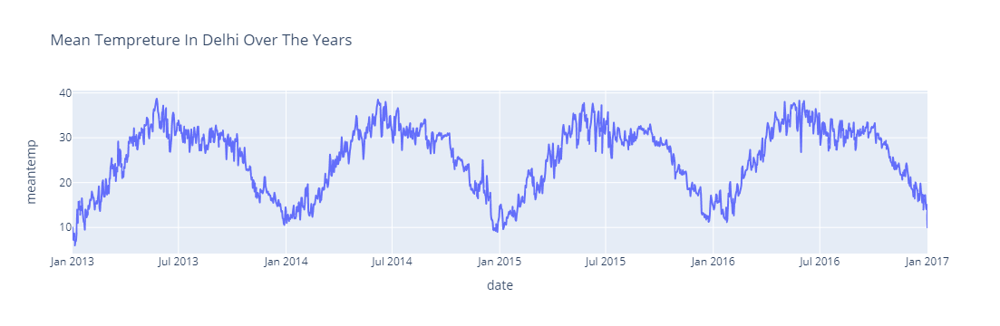

In [4]:
px.line(data, x='date',
        y='meantemp',
        title='Mean Tempreture In Delhi Over The Years').show()


## Humidity - الرطوبه

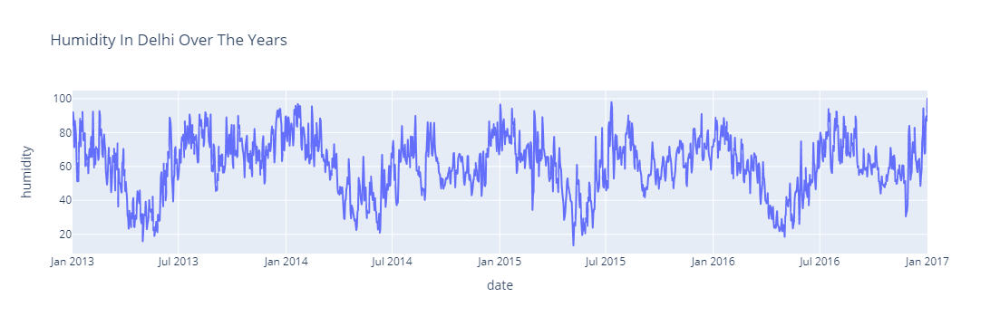

In [5]:
px.line(data, x='date',
        y='humidity',
        title='Humidity In Delhi Over The Years').show()

## Wind Speed - سرعة الرياح

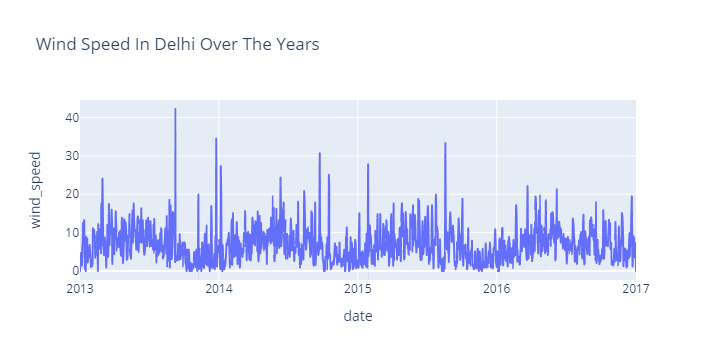

In [5]:
figure= px.line(data, x='date',
        y='wind_speed',
        title='Wind Speed In Delhi Over The Years')

figure.show()

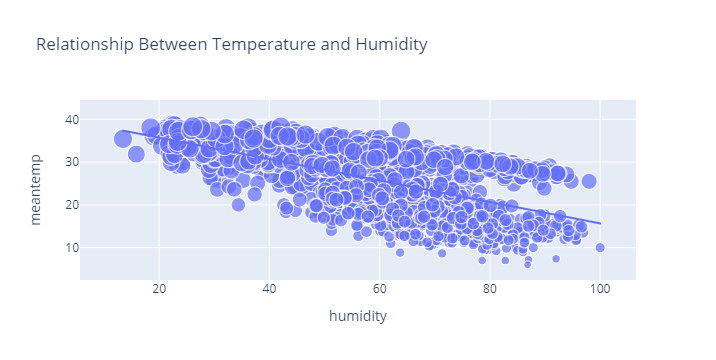

In [8]:
# The relationship between humidity and temperature
px.scatter(data_frame = data, x="humidity",
           y="meantemp",
           size="meantemp",
           trendline="ols", 
           title="Relationship Between Temperature and Humidity").show()



There is a negative relationship between temperature and humidity in Delhi. This means that higher temperature results in lower humidity and lower temperature results in higher humidity.

هناك علاقة سلبية بين درجة الحرارة والرطوبة ف دلهي. وهذا يعني أن ارتفاع درجة الحرارة يؤدي إلى انخفاض الرطوبة وانخفاض درجة الحرارة يؤدي إلى ارتفاع نسبة الرطوبة

## Temperature change  - التغير في درجة الحرارة


In [10]:
# Change data type and extract year and month data from date column
data["date"] = pd.to_datetime(data["date"], format='%Y-%m-%d')
data['year'] = data['date'].dt.year
data["month"] = data["date"].dt.month
print(data.head())


        date   meantemp   humidity  wind_speed  meanpressure  year  month
0 2013-01-01  10.000000  84.500000    0.000000   1015.666667  2013      1
1 2013-01-02   7.400000  92.000000    2.980000   1017.800000  2013      1
2 2013-01-03   7.166667  87.000000    4.633333   1018.666667  2013      1
3 2013-01-04   8.666667  71.333333    1.233333   1017.166667  2013      1
4 2013-01-05   6.000000  86.833333    3.700000   1016.500000  2013      1


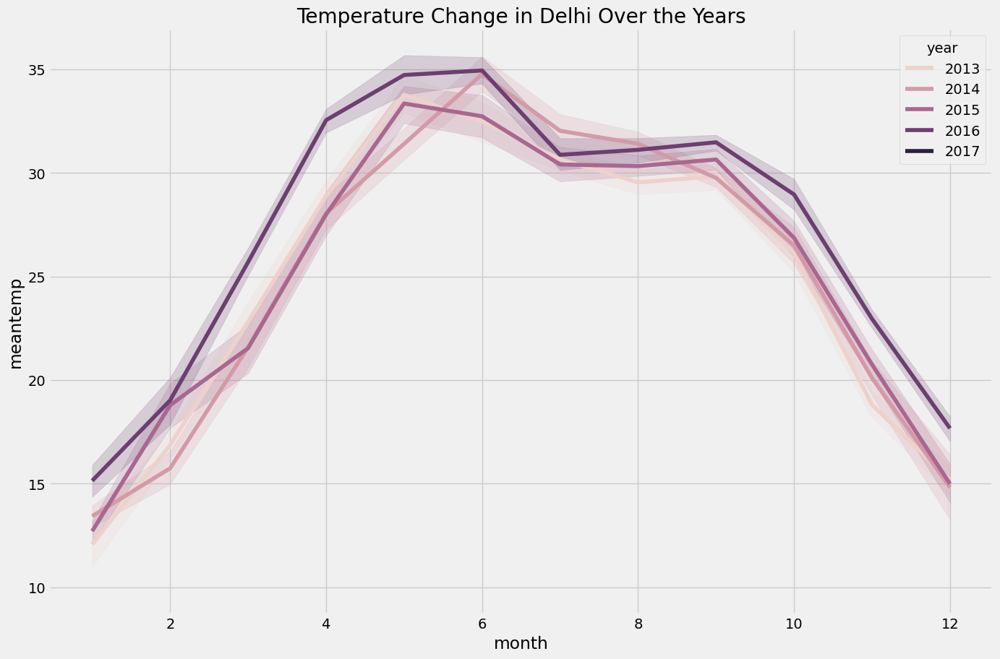

In [11]:
plt.style.use('fivethirtyeight')
plt.figure(figsize=(15, 10))
plt.title("Temperature Change in Delhi Over the Years")
sns.lineplot(data=data, x='month', y='meantemp', hue='year')
plt.show()


We can see an increase in the average temperature of Delhi every year.

## weather forecast - التنبؤ بالطقس 

In [13]:
#Prepare data for using with Prophet library
forecast_data = data.rename(columns={"date": "ds" , "meantemp": "y"})
print(forecast_data)


             ds          y    humidity  wind_speed  meanpressure  year  month
0    2013-01-01  10.000000   84.500000    0.000000   1015.666667  2013      1
1    2013-01-02   7.400000   92.000000    2.980000   1017.800000  2013      1
2    2013-01-03   7.166667   87.000000    4.633333   1018.666667  2013      1
3    2013-01-04   8.666667   71.333333    1.233333   1017.166667  2013      1
4    2013-01-05   6.000000   86.833333    3.700000   1016.500000  2013      1
...         ...        ...         ...         ...           ...   ...    ...
1457 2016-12-28  17.217391   68.043478    3.547826   1015.565217  2016     12
1458 2016-12-29  15.238095   87.857143    6.000000   1016.904762  2016     12
1459 2016-12-30  14.095238   89.666667    6.266667   1017.904762  2016     12
1460 2016-12-31  15.052632   87.000000    7.325000   1016.100000  2016     12
1461 2017-01-01  10.000000  100.000000    0.000000   1016.000000  2017      1

[1462 rows x 7 columns]


10:46:46 - cmdstanpy - INFO - Chain [1] start processing
10:46:47 - cmdstanpy - INFO - Chain [1] done processing


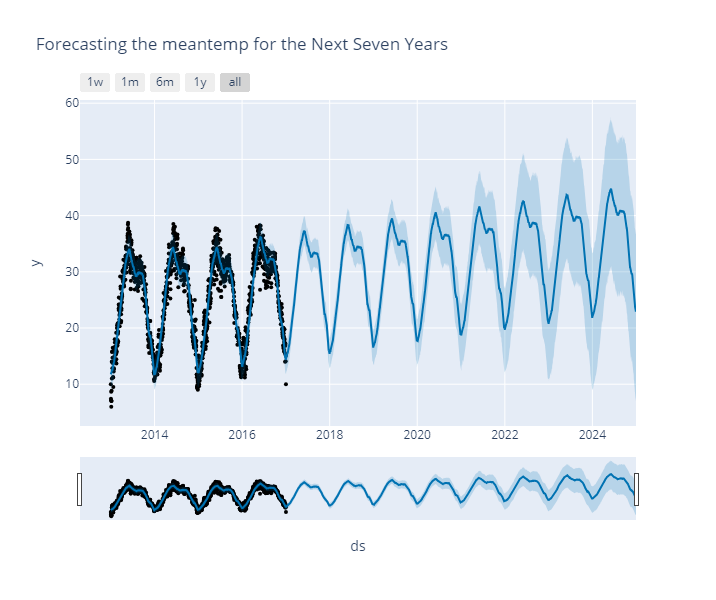

In [18]:
from prophet import Prophet
from prophet.plot import plot_plotly
model = Prophet()
model.fit(forecast_data)
forecasts = model.make_future_dataframe(periods=365*8) #forecast For the next seven years
predictions = model.predict(forecasts)
fig=plot_plotly(model, predictions)
fig.update_layout(title="Forecasting the meantemp for the Next Seven Years")
fig.show()

